In [14]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np
from scipy import ndimage as ndi
import skimage
from skimage import io, filters, morphology
import pandas as pd
import glob
import random
import seaborn as sns
from scipy import stats
from scipy.signal import chirp, find_peaks, peak_widths
from pathlib import Path
import scipy.stats
import os
from scipy import ndimage
import math
from operator import itemgetter
from matplotlib import pyplot
#from read_roi import read_roi_zip
from scipy.optimize import curve_fit
from scipy import signal
from scipy.interpolate import interp1d, splev, CubicSpline, PPoly
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D


In [15]:
#define functions

In [16]:
def display(im3d, cmap="gray", step=1, chosen = None):
    if chosen is None: 
        chosen = []
    stack_size = im3d.shape[0]
    cols = 5
    rows = math.ceil((stack_size/cols))
    
    h , axes = plt.subplots(nrows=rows, ncols=cols, figsize=(3*cols, 3*rows))
    #print(h)
    #p1 = get(h,'Position')
    #annotation('rectangle',p1,'FaceAlpha',.2,'FaceColor','red','EdgeColor','red') 
    vmin = im3d.min()
    vmax = im3d.max()
    enum = 0
    for ax, image in zip(axes.flatten(), im3d[::step]):
        ax.imshow(image, cmap=cmap, vmin=vmin, vmax=vmax)
        if enum in chosen:
            for axis in ['top','bottom','left','right']:
                #ax.spines[axis].set_linewidth(0.5)
                ax.spines[axis].set_color("red")
                ax.spines[axis].set_linewidth(5)
        ax.set_xticks([])
        ax.set_yticks([])
        enum += 1
    #plt.savefig('foo.png')
    

In [17]:
def display_slice(im, cmap="gray", step=1, chosen = None, savefig = False):
    h , axes = plt.subplots(1,1)
    vmin = im.min()
    vmax = im.max()
    enum = 0
    axes.imshow(im, cmap=cmap, vmin=vmin, vmax=vmax)

In [18]:
#functions to get the peak indexes for a particular channel

#get indexes of peaks for edu and hoechst channels in an array, the midpoint is the sum of the peak indexes divided by 2. Can be then converted into a distance.
def get_index(a, b):
    return (a+b)/2

#get the index of a single channel
def get_index_single_axis(a):
    return (a)

#get indexes of peaks for split smc4 or scc1 peaks for subsequent alignment the midpoint is the sum of the peak indexes divided by 2. Can be then converted into a distance.

def get_index_centre_split_axes(a,b):
    return (a+b)/2

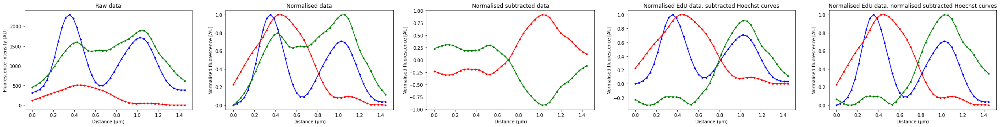

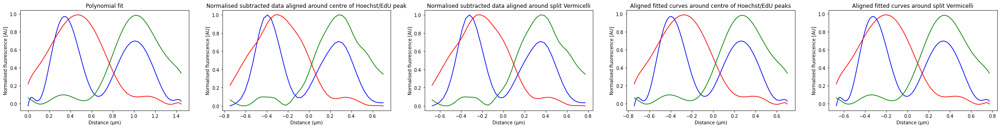

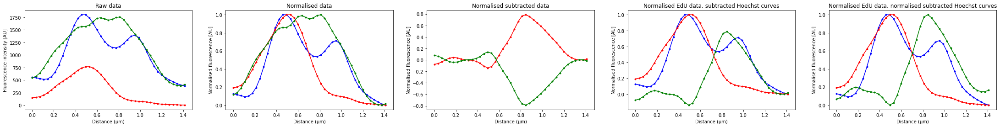

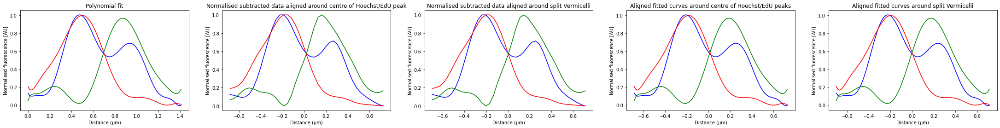

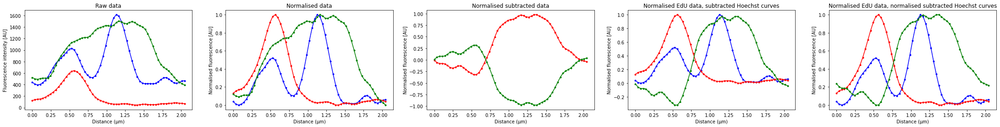

...

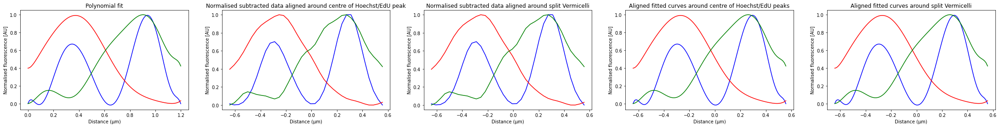

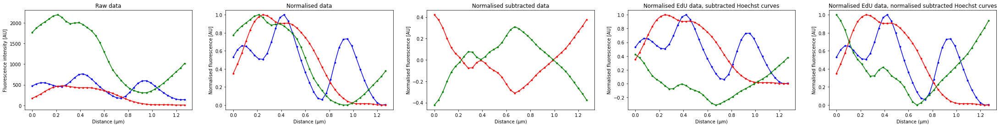

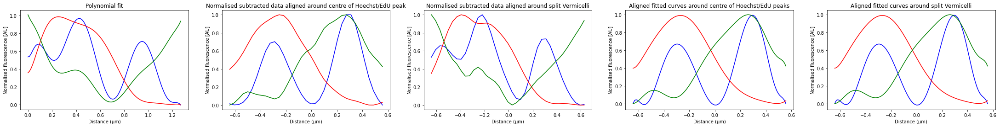

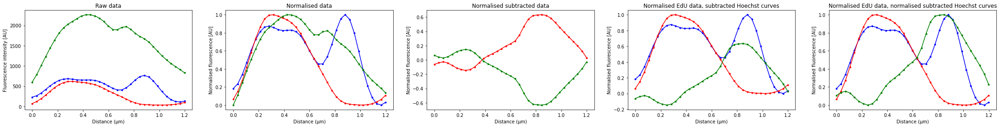

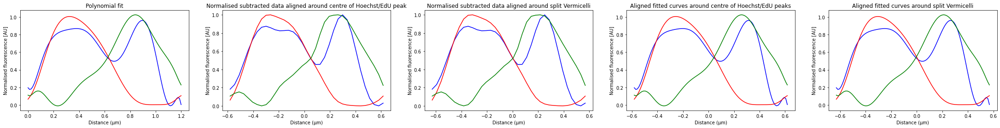

KeyboardInterrupt: 

In [19]:
#read in files
path5 = "/groups/gerlich/experiments/Experiments_005500/005556/late_prophase_paper/"

csv_files = glob.glob(path5 + "*/*.csv")
### Fetch all files in path

#head, tail = os.path.split(path_lateprophase)
#set condition
condition = "WT late prophase"

#set up empty lists to append
name = []
#scc1 channel
peaks1_scc1 = []
peaks2_scc1 = []
peaks1_value_scc1 = []
peaks2_value_scc1 = []

#edu channel
peaks1_edu = []
peaks1_value_edu = []

#hoechst channel
peaks1_hoechst = []
peaks1_value_hoechst = []

distance_scc1_peaks1_all = []
distance_scc1_peaks2_all = []
distance_edu_peaks_all = []
distance_hoechst_peaks_all = []

all_displacement_edu_scc1_first = []
all_displacement_edu_scc1_second = []
all_displacement_hoechst_scc1_first = []
all_displacement_hoechst_scc1_second = []
#all_displacement_scc1_edu = []

all_mid_point_split_scc1_peaks = []

all_displacement_from_centre_split_axes_edu = []
all_displacement_from_centre_split_axes_hoechst = []


for file in csv_files:
    split = file.split(os.sep)
    image_name = split[-2]
    #read in line profiles
    df = pd.read_csv(file, index_col = 0)
       
    #rename columns
    df.columns = ['Distance', 'scc1', 'edu', 'hoechst']
    
    #set distance to variable
    distance = df.loc[:, "Distance"]
   
    #deep copy and then min/max normalisation
    df2 = df.copy()
    for column in df2.columns:
        df2[column] = (df2[column] - df2[column].min()) / (df2[column].max() - df2[column].min())   
        
        df2["Distance"] = distance     

    #subtract edu values from hoechst values

    if np.where(df2['edu']>= df2["hoechst"]):
        df2["hoechst_minus_edu"] = (df2['hoechst'] - df2["edu"])
    
    #subtract hoechst values from edu values
    if np.where(df2['hoechst']>= df2["edu"]):
        df2["edu_minus_hoechst"] = (df2['edu'] - df2["hoechst"])

    #normalisation of subtracted data
    df3 = df2.copy()
    
    df3["hoechst_minus_edu"] = (df3["hoechst_minus_edu"] - df3["hoechst_minus_edu"].min()) / (df3["hoechst_minus_edu"].max() - df3["hoechst_minus_edu"].min())
    df3.rename(columns = {'hoechst_minus_edu':'hoechst_minus_edu_norm'}, inplace = True)

    df3["Distance"] = distance
  
    #drop NaN values
    df3 = df3.dropna(axis=0)
    
    #set results directory
    resultsdir_plotprofiles = "/groups/gerlich/experiments/Experiments_005500/005556/csv_files_plot_profiles/"
    
    #df3.to_csv(resultsdir_plotprofiles + "wapl_sororin_depleted_g2.csv", index=False)
    
    
    #fit the data using polynomial fit
    #scc1 channel
    p = np.poly1d(np.polyfit(df3["Distance"],df3["scc1"], 10))
    #edu channel
    q = np.poly1d(np.polyfit(df3["Distance"],df3["edu"], 10))
    #normalised hoechst channel
    r = np.poly1d(np.polyfit(df3["Distance"],df3["hoechst_minus_edu_norm"], 10))
    #x-axis values
    
    #find peaks
    t = np.linspace(0,max(df3["Distance"]), 100)
    peaks_scc1, heights_scc1 = signal.find_peaks(p(t),max(df3["scc1"])*0.6)
    peaks_edu, heights_edu = signal.find_peaks(q(t),max(df3["edu"])*0.6)
    peaks_hoechst, heights_hoechst = signal.find_peaks(r(t),max(df3["hoechst_minus_edu_norm"])*0.6)

    #only select when there is a single peak for edu and hoechst and two peaks for scc1
    if len(peaks_edu) == 1 and len(peaks_hoechst) == 1 and len(peaks_scc1) == 2:
        #slice t, using index of the channel peak to get the distance value for the three channels 
        distance_scc1_peak = t[peaks_scc1]
        distance_edu_peak = t[peaks_edu]
        distance_hoechst_peak = t[peaks_hoechst]
        
        displacement_hoechst_scc1 = (t[peaks_hoechst]) - (t[peaks_scc1])   
        displacement_edu_scc1 = (t[peaks_edu]) - (t[peaks_scc1])    
        

        #append each line profile to each list for the three channels
        peaks1_scc1.append(peaks_scc1[0])
        peaks2_scc1.append(peaks_scc1[1])
        peaks1_value_scc1.append(heights_scc1['peak_heights'][0])
        peaks2_value_scc1.append(heights_scc1['peak_heights'][1])
        distance_scc1_peaks1_all.append(distance_scc1_peak[0])
        distance_scc1_peaks2_all.append(distance_scc1_peak[1])

        peaks1_edu.append(peaks_edu[0])
        #peaks2_scc1.append(peaks_scc1[1])
        peaks1_value_edu.append(heights_edu['peak_heights'][0])
        distance_edu_peaks_all.append(distance_edu_peak[0])

        peaks1_hoechst.append(peaks_hoechst[0])
        #peaks2_scc1.append(peaks_scc1[1])
        peaks1_value_hoechst.append(heights_hoechst['peak_heights'][0])
        distance_hoechst_peaks_all.append(distance_hoechst_peak[0])
        
        all_displacement_edu_scc1_first.append(displacement_edu_scc1[0])
        #all_displacement_edu_scc1_second.append(displacement_edu_scc1[1])  
        #all_displacement_hoechst_scc1_first.append(displacement_hoechst_scc1[0])
        all_displacement_hoechst_scc1_second.append(displacement_hoechst_scc1[1])
               
        centre_index = list(map(get_index, peaks1_edu, peaks1_hoechst))
                        
        for i in centre_index:
            values = float(i)
            if values % 1 < 0.5:
                centre = math.floor(values)
            else:
                centre = math.ceil(values)
                        
        norm = t[centre]
        #all_norm.append(norm)
        #print(values, centre)

        x_align_dna = (t-norm)
        y1_align_dna = p(t)
        y2_align_dna = q(t)
        y3_align_dna = r(t)
        
        x_norm_aligned_dna = ((df2["Distance"])-norm)
        y1_norm_aligned_dna = ((df2["scc1"]))
        y2_norm_aligned_dna = ((df2["edu"]))
        y3_norm_aligned_dna = ((df3["hoechst_minus_edu_norm"]))            
                      
        centre_index_single_axis = list(map(get_index_centre_split_axes, peaks2_scc1, peaks1_scc1))

        for i in centre_index_single_axis:
            centre_axis = int(i)
            centre_axis
        norm_axis = t[centre_axis]
        #print(centre_axis, norm_axis)
            
        x_align_axis = (t-norm_axis)
        y1_align_axis = p(t)
        y2_align_axis = q(t)
        y3_align_axis = r(t)
        
        x_norm_aligned_axis = ((df2 ["Distance"])-norm_axis)
        y1_norm_aligned_axis = ((df2["scc1"]))
        y2_norm_aligned_axis = ((df2["edu"]))
        y3_norm_aligned_axis = ((df3["hoechst_minus_edu_norm"]))             
        
        #mid_point_split_scc1_peaks = t[centre_axis]
        
        displacement_from_centre_split_axes_edu = (t[centre_axis]) - (t[peaks_edu])
        displacement_from_centre_split_axes_hoechst = (t[peaks_hoechst]) - (t[centre_axis])   
                
        #all_mid_point_split_scc1_peaks.append(mid_point_scc1_scc1_peaks)
        
        all_displacement_from_centre_split_axes_edu.append(displacement_from_centre_split_axes_edu[0])
        all_displacement_from_centre_split_axes_hoechst.append(displacement_from_centre_split_axes_hoechst[0])

        
        #append image name
        name.append(image_name)          

    #plot raw data, normalised data, subtracted data
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize = (38,4))
      
    
    #plot raw data
    x_raw = df["Distance"]
    y1_raw = df["scc1"]
    y2_raw = df["edu"]
    y3_raw = df["hoechst"]
            
    ax1.plot(x_raw, y1_raw, c='b', marker = '.', label='smc4')
    ax1.plot(x_raw, y2_raw, c='r', marker = '.', label='edu')
    ax1.plot(x_raw, y3_raw, c='g', marker = '.', label='hoechst')  
    #plt.xlim([0, 1.6])
    
    #plot normalised data - min/max normalisation
    x_norm = df2 ["Distance"]
    y1_norm = df2["scc1"]
    y2_norm = df2["edu"]
    y3_norm = df2["hoechst"]
       
    ax2.plot(x_norm,y1_norm, c='b', marker = '.', label='smc4')
    ax2.plot(x_norm, y2_norm, c='r', marker = '.', label='edu')
    ax2.plot(x_norm, y3_norm, c='g', marker = '.', label='hoechst')
    
    
    #plot subtracted curves - edu minus hoechst, hoechst minus edu
    x_subtract = df2["Distance"]
    y1_subtract = df2["hoechst_minus_edu"]
    y2_subtract = df2["edu_minus_hoechst"]
    
    ax3.plot(x_subtract, y1_subtract, c='r', marker = '.', label='edu')
    ax3.plot(x_subtract, y2_subtract, c='g', marker = '.', label='hoechst')
    
    ax4.plot(x_norm, y1_norm, c='b', marker = '.', label='smc4')
    ax4.plot(x_norm, y2_norm, c='r', marker = '.', label='edu')
    ax4.plot(x_norm, y1_subtract, c='g', marker = '.', label='hoechst')
    
    y1_renorm = df3["hoechst_minus_edu_norm"]
    
    ax5.plot(x_norm, y1_norm, c='b', marker = '.', label='smc4')
    ax5.plot(x_norm, y2_norm, c='r', marker = '.', label='edu')
    ax5.plot(x_norm, y1_renorm, c='g', marker = '.', label='hoechst')
    
    # set axis labels
    ax1.set_xlabel('Distance (µm)')
    ax1.set_ylabel('Fluorescence intensity [AU]')
    ax2.set_xlabel('Distance (µm)')
    ax2.set_ylabel('Normalised fluorescence [AU]')
    ax3.set_xlabel('Distance (µm)')
    ax3.set_ylabel('Normalised fluorescence [AU]')
    ax4.set_xlabel('Distance (µm)')
    ax4.set_ylabel('Normalised fluorescence [AU]')
    ax5.set_xlabel('Distance (µm)')
    ax5.set_ylabel('Normalised fluorescence [AU]')
    
    #set plot titles
    ax1.title.set_text('Raw data')
    ax2.title.set_text('Normalised data')
    ax3.title.set_text('Normalised subtracted data')
    ax4.title.set_text('Normalised EdU data, subtracted Hoechst curves')
    ax5.title.set_text('Normalised EdU data, normalised subtracted Hoechst curves')
    
    #get conditions for labels
    labels = ["SMC4", "f-ara-EdU", "Hoechst"]
    #handles, labels = ax1.get_legend_handles_labels()
    #fig.legend(handles, labels, loc='lower center',prop={"size":16})
        
    plt.show()
    
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize = (38,4))
    #plot the data - same colour scheme as other plots below
    x_fitted = t
    y1_fitted = p(t)
    y2_fitted = q(t)
    y3_fitted = r(t)
    ax1.plot(x_fitted, y1_fitted, c='b', label='scc1')
    ax1.plot(x_fitted, y2_fitted, c='r', label='edu')
    ax1.plot(x_fitted, y3_fitted, c='g', label='hoechst')
    ax1.set_title("Polynomial fit")
    ax1.set_xlabel('Distance (µm)')
    ax1.set_ylabel('Normalised fluorescence [AU]')    
        
    ax2.plot(x_norm_aligned_dna, y1_norm_aligned_dna, c='b', label='scc1')
    ax2.plot(x_norm_aligned_dna, y2_norm_aligned_dna, c='r', label='edu')
    ax2.plot(x_norm_aligned_dna, y3_norm_aligned_dna, c='g', label='hoechst')
    ax2.set_title("Normalised subtracted data aligned around centre of Hoechst/EdU peak")
    ax2.set_xlabel('Distance (µm)')
    ax2.set_ylabel('Normalised fluorescence [AU]')
    
    x_norm_aligned_axis = ((df2 ["Distance"])-norm_axis)
    y1_norm_aligned_axis = ((df2["scc1"]))
    y2_norm_aligned_axis = ((df2["edu"]))
    y3_norm_aligned_axis = ((df3["hoechst_minus_edu_norm"])) 
    
    ax3.plot(x_norm_aligned_axis, y1_norm_aligned_axis, c='b', label='scc1')
    ax3.plot(x_norm_aligned_axis, y2_norm_aligned_axis, c='r', label='edu')
    ax3.plot(x_norm_aligned_axis, y3_norm_aligned_axis, c='g', label='hoechst')
    ax3.set_title("Normalised subtracted data aligned around split Vermicelli")
    ax3.set_xlabel('Distance (µm)')
    ax3.set_ylabel('Normalised fluorescence [AU]')
    
    
    ax4.plot(x_align_dna, y1_align_dna, c='b', label='scc1')
    ax4.plot(x_align_dna, y2_align_dna, c='r', label='edu')
    ax4.plot(x_align_dna, y3_align_dna, c='g', label='hoechst')
    ax4.set_title("Aligned fitted curves around centre of Hoechst/EdU peaks")
    ax4.set_xlabel('Distance (µm)')
    ax4.set_ylabel('Normalised fluorescence [AU]')

    ax5.plot(x_align_axis, y1_align_axis, c='b', label='scc1')
    ax5.plot(x_align_axis, y2_align_axis, c='r', label='edu')
    ax5.plot(x_align_axis, y3_align_axis, c='g', label='hoechst')
    ax5.set_title("Aligned fitted curves around split Vermicelli")
    ax5.set_xlabel('Distance (µm)')
    ax5.set_ylabel('Normalised fluorescence [AU]')
    
    
    #set results directory
    resultsdir = "/groups/gerlich/experiments/Experiments_005500/005556/csv_files_sep/"

    #zip the data to make a dataframe
    df1 = pd.DataFrame(list(zip(name,peaks1_scc1, peaks1_value_scc1, peaks2_scc1, peaks2_value_scc1, peaks1_edu, peaks1_value_edu, peaks1_hoechst, peaks1_value_hoechst, all_displacement_edu_scc1_first, all_displacement_hoechst_scc1_second, all_displacement_from_centre_split_axes_edu, all_displacement_from_centre_split_axes_hoechst, distance_scc1_peaks1_all, distance_scc1_peaks2_all, distance_edu_peaks_all, distance_hoechst_peaks_all)),columns=['name','scc1_peak1', 'scc1_peak1_value', 'scc1_peak2', 'scc1_peak2_value', 'edu_peak', 'edu_peak1_value', 'hoechst_peak', 'hoechst_peak1_value', 'difference_edu_scc1_peak', 'difference_hoechst_scc1_peak', 'difference_centre_split_edu', 'difference_centre_split_hoechst', 'distance_scc1_peak1', 'distance_scc1_peak2', 'distance_edu_peak', 'distance_hoechst_peak'])
    
    #calculate difference between normalised edu signal and normalised subtracted hoechst signal - this is the resolution output
    sister_separation = (df1.loc[:, "distance_hoechst_peak"])-(df1.loc[:, "distance_edu_peak"])
    df1["sister_separation"] = sister_separation
    position_of_axis = (df1.loc[:, "difference_centre_split_hoechst"]) - (df1.loc[:, "difference_centre_split_edu"])
    df1["position_of_axis"] = position_of_axis
    
    axis_distance = (df1.loc[:, "distance_scc1_peak2"])-(df1.loc[:, "distance_scc1_peak1"])
    df1["axis_distance"] = axis_distance
    
    displacement_from_axis = ((df1.loc[:, "sister_separation"])-(df1.loc[:, "axis_distance"])) / 2
    df1["displacement_from_axis"] = displacement_from_axis
    df1["condition"] = condition
    #df1.to_csv(resultsdir + "sep_around_axes_" + condition + ".csv", index=False)
